In [94]:
# !pip install notebook
# !pip install numpy pandas matplotlib seaborn plotly folium

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import plotly.express as px
import folium
import json
from folium import Choropleth

%matplotlib inline

sns.set_style("darkgrid")
matplotlib.rcParams["font.size"] = 14
matplotlib.rcParams["figure.figsize"] = (9, 5)
matplotlib.rcParams["figure.facecolor"] = "#00000000"

In [4]:
shopping_trends_raw_df = pd.read_csv("shopping_trends.csv")
shopping_trends_raw_df.head(2)

,Customer ID,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Payment Method,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Preferred Payment Method,Frequency of Purchases
0,1,55,Male,Blouse,Clothing,53,Kentucky,L,Gray,Winter,3.1,Yes,Credit Card,Express,Yes,Yes,14,Venmo,Fortnightly
1,2,19,Male,Sweater,Clothing,64,Maine,L,Maroon,Winter,3.1,Yes,Bank Transfer,Express,Yes,Yes,2,Cash,Fortnightly


In [5]:
shopping_trends_raw_df.describe()

,Customer ID,Age,Purchase Amount (USD),Review Rating,Previous Purchases
count,3900.000000,3900.000000,3900.000000,3900.000000,3900.000000
mean,1950.500000,44.068462,59.764359,3.749949,25.351538
std,1125.977353,15.207589,23.685392,0.716223,14.447125
min,1.000000,18.000000,20.000000,2.500000,1.000000
25%,975.750000,31.000000,39.000000,3.100000,13.000000
50%,1950.500000,44.000000,60.000000,3.700000,25.000000
75%,2925.250000,57.000000,81.000000,4.400000,38.000000
max,3900.000000,70.000000,100.000000,5.000000,50.000000


In [6]:
shopping_trends_raw_df.shape

(3900, 19)

In [7]:
shopping_trends_raw_df.columns

Index(['Customer ID', 'Age', 'Gender', 'Item Purchased', 'Category',
       'Purchase Amount (USD)', 'Location', 'Size', 'Color', 'Season',
       'Review Rating', 'Subscription Status', 'Payment Method',
       'Shipping Type', 'Discount Applied', 'Promo Code Used',
       'Previous Purchases', 'Preferred Payment Method',
       'Frequency of Purchases'],
      dtype='object')

In [8]:
shopping_trends_raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 19 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Customer ID               3900 non-null   int64  
 1   Age                       3900 non-null   int64  
 2   Gender                    3900 non-null   object 
 3   Item Purchased            3900 non-null   object 
 4   Category                  3900 non-null   object 
 5   Purchase Amount (USD)     3900 non-null   int64  
 6   Location                  3900 non-null   object 
 7   Size                      3900 non-null   object 
 8   Color                     3900 non-null   object 
 9   Season                    3900 non-null   object 
 10  Review Rating             3900 non-null   float64
 11  Subscription Status       3900 non-null   object 
 12  Payment Method            3900 non-null   object 
 13  Shipping Type             3900 non-null   object 
 14  Discount

# Customer Demographics
## Age Distribution

### Histogram
- To show the distribution of ages.

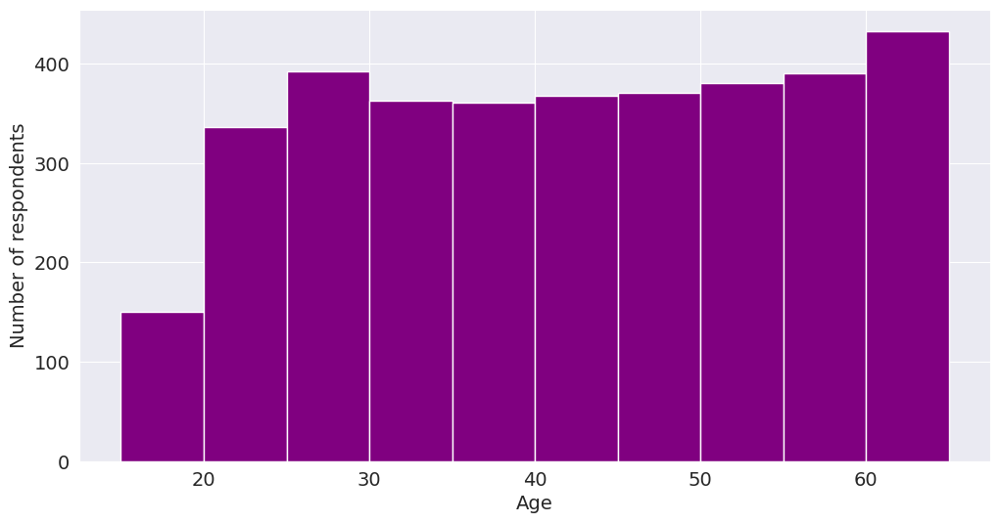

In [9]:
plt.figure(figsize=(12, 6))
plt.xlabel('Age')
plt.ylabel('Number of respondents')
plt.hist(shopping_trends_raw_df.Age, bins=np.arange(15, 70, 5), color='purple');

In [10]:
fig = px.histogram(shopping_trends_raw_df, x="Age")
fig.show()

### Boxplot
- To visualize age spread and outliers.

In [11]:
fig = px.box(shopping_trends_raw_df, x="Gender", y="Age")
fig.show()

## Gender Analysis

### Bar Chart 
- To compare total purchases or average spend by gender.

In [12]:
fig = px.bar(shopping_trends_raw_df, x='Gender', y='Purchase Amount (USD)')
fig.show()

In [13]:
gender_items_count = shopping_trends_raw_df.groupby(['Gender', 'Item Purchased']).count().reset_index()[['Gender', 'Item Purchased', 'Age']]
gender_items_count.columns = ['Gender', 'Item Purchased', 'Count']
gender_items_count.head(2)
fig = px.bar(gender_items_count, x='Gender', y='Count', color='Item Purchased')
fig.show()

In [14]:
gender_items_sum = shopping_trends_raw_df.groupby(['Gender', 'Item Purchased']).sum().reset_index()[['Gender', 'Item Purchased', 'Age']]
gender_items_sum.columns = ['Gender', 'Item Purchased', 'Count']
gender_items_sum.head(2)
fig = px.bar(gender_items_sum, x='Gender', y='Count', color='Item Purchased')
fig.show()

### Pie Chart
- To show the proportion of purchases by gender.

In [15]:
fig = px.pie(gender_items_count, values='Count', names='Gender')
fig.show()

In [16]:
fig = px.pie(gender_items_sum, values='Count', names='Gender')
fig.show()

## Location-Based Analysis

### Heatmap (on a map)
- To show purchase trends by region.

In [17]:
!wget -nc --quiet "https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/us-states.json"
!wget -nc --quiet "https://gist.githubusercontent.com/mshafrir/2646763/raw/8b0dbb93521f5d6889502305335104218454c2bf/states_hash.json"

In [18]:
world_geo = r'us-states.json'
with open('states_hash.json') as json_data:
    states_hash = json.load(json_data)
us_states = shopping_trends_raw_df['Location'].unique()
us_states[:2]
code_states = {}

location_group_df = shopping_trends_raw_df.groupby(["Location"])["Purchase Amount (USD)"].sum().reset_index(name="sum").sort_values(["sum"], ascending=False)

for k, v in states_hash.items():
    code_states[v]=k
location_group_df['code'] = [code_states.get(k) for k in location_group_df['Location']]
location_group_df.sample(2)
world_map = folium.Map(location=[37.8, -96], zoom_start=4)
# Add choropleth layer
cp = Choropleth(
    geo_data=world_geo,
    name="choropleth",
    data=location_group_df,
    columns=["code", "sum"],
    key_on="feature.id",  # Match GeoJSON `id` field with `state_code`
    fill_color="YlGnBu",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Shopping",
    highlight=True,
).add_to(world_map);
location_group_df_indexed = location_group_df.set_index('code')
for s in cp.geojson.data['features']:
     s['properties']['sum'] = str(location_group_df_indexed.loc[s['id'], 'sum'])
folium.GeoJsonTooltip(["name", 'sum'],aliases=['Name:','Purchase Amount (USD): ']).add_to(cp.geojson);

In [19]:
world_map

### Bar Chart
- For a straightforward comparison of revenue or volume by location.

In [20]:
location_item = shopping_trends_raw_df.groupby(['Location', 'Item Purchased'])['Previous Purchases'].count().reset_index()
location_item.columns = ['Location', 'Item Purchased', 'Count']
location_item.head(2)
fig = px.bar(location_item, x="Location", y="Count", color="Item Purchased")
fig.show()

## Product Insights
### Category and Item Trends

### Bar Chart
- To rank categories or items by popularity.

In [21]:
items_count = shopping_trends_raw_df["Item Purchased"].value_counts().reset_index()
items_count.columns = ['Item Purchased', 'Counts']
items_count.head(2)
fig = px.bar(location_item, x="Item Purchased", y="Count")
fig.show()

In [22]:
items_sum = shopping_trends_raw_df.groupby(['Item Purchased'])['Previous Purchases'].sum().reset_index()
items_sum.columns = ['Item Purchased', 'Count']
items_sum.head(2)
fig = px.bar(items_sum, x="Item Purchased", y="Count")
fig.show()

In [23]:
category_count = shopping_trends_raw_df["Category"].value_counts().reset_index()
category_count.columns = ['Category', 'Count']
category_count.head(2)
fig = px.bar(category_count, x="Category", y="Count")
fig.show()

## Size and Color Preferences

### Stacked Bar Chart
- To compare sizes and colors within a category.

In [24]:
category_size_group_by = shopping_trends_raw_df.groupby(['Category', 'Size']).count().reset_index()[['Category', 'Size', 'Age']]
category_size_group_by.columns = ['Category', 'Size', 'Count']
category_size_group_by.sample(2)
fig = px.bar(category_size_group_by, x="Category", y="Count", color="Size")
fig.show()

In [25]:
category_color_group_by = shopping_trends_raw_df.groupby(['Category', 'Color']).count().reset_index()[['Category', 'Color', 'Age']]
category_color_group_by.columns = ['Category', 'Color', 'Count']
category_color_group_by.sample(2)
color_dict = {a:a for a in category_color_group_by['Color'].unique()}
color_dict['Charcoal'] = "#36454F"
color_dict['Peach'] = "#ffe5b4"
fig = px.bar(category_color_group_by, x="Category", y="Count", color="Color", color_discrete_map=color_dict)
fig.show()

In [26]:
color_size_group_by = shopping_trends_raw_df.groupby(['Color', 'Size']).count().reset_index()[['Color', 'Size', 'Age']]
color_size_group_by.columns = ['Color', 'Size', 'Count']
color_size_group_by.sample(2)
fig = px.bar(color_size_group_by, x="Color", y="Count", color="Size")
fig.show()

In [27]:
fig = px.bar(color_size_group_by, x="Size", y="Count", color="Color", color_discrete_map=color_dict)
fig.show()

## Seasonal Analysis

### Line Chart
- To show sales trends across seasons.

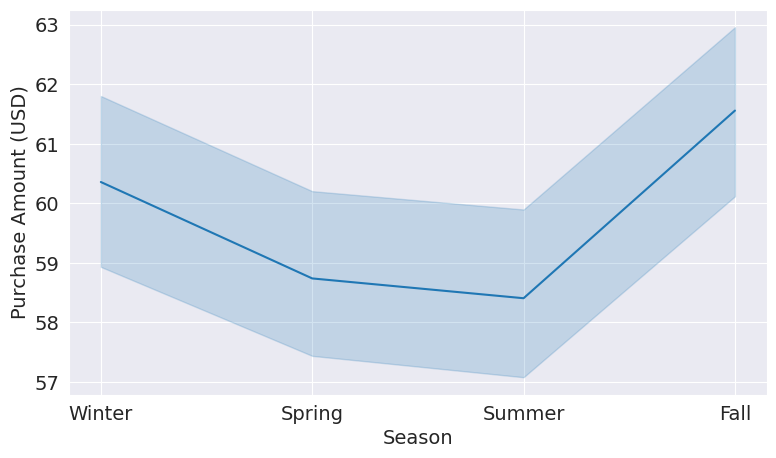

In [28]:
sns.lineplot(x="Season", y="Purchase Amount (USD)", data=shopping_trends_raw_df)
plt.show()

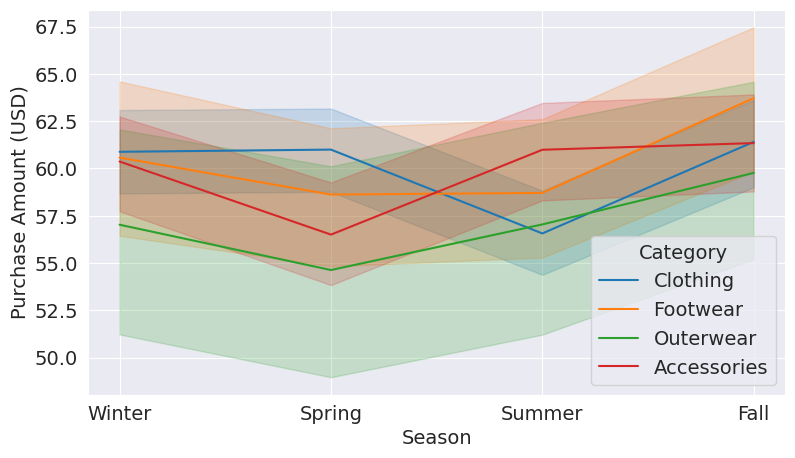

In [29]:
sns.lineplot(x='Season', y='Purchase Amount (USD)', hue='Category', data=shopping_trends_raw_df)
plt.show()

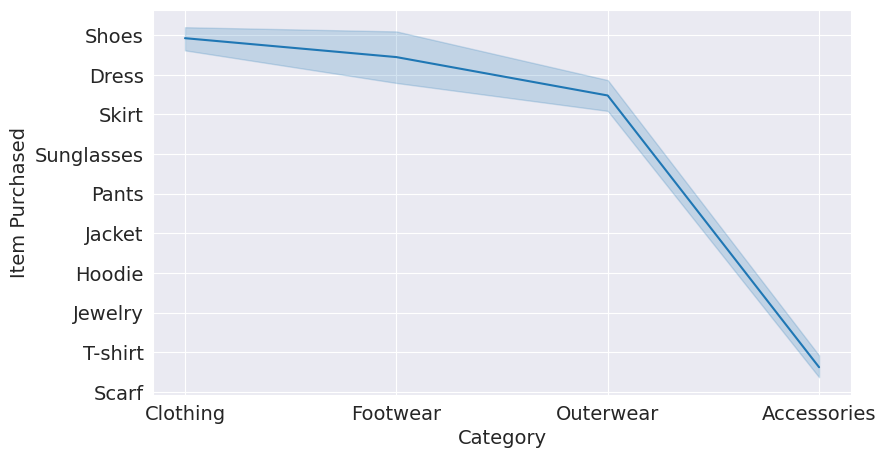

In [30]:
sns.lineplot(x="Category", y="Item Purchased", data=shopping_trends_raw_df) 
plt.show()

### Bar Chart
- To compare sales by season.

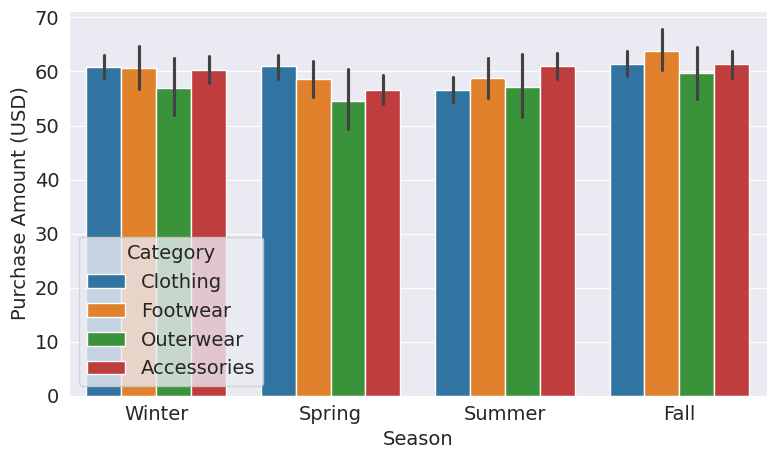

In [31]:
sns.barplot(x = 'Season', y = 'Purchase Amount (USD)', hue = 'Category', data = shopping_trends_raw_df)
plt.show()

## Sales and Revenue
### Revenue Breakdown

### Bar Chart
- To compare revenue by category, location, or demographic.

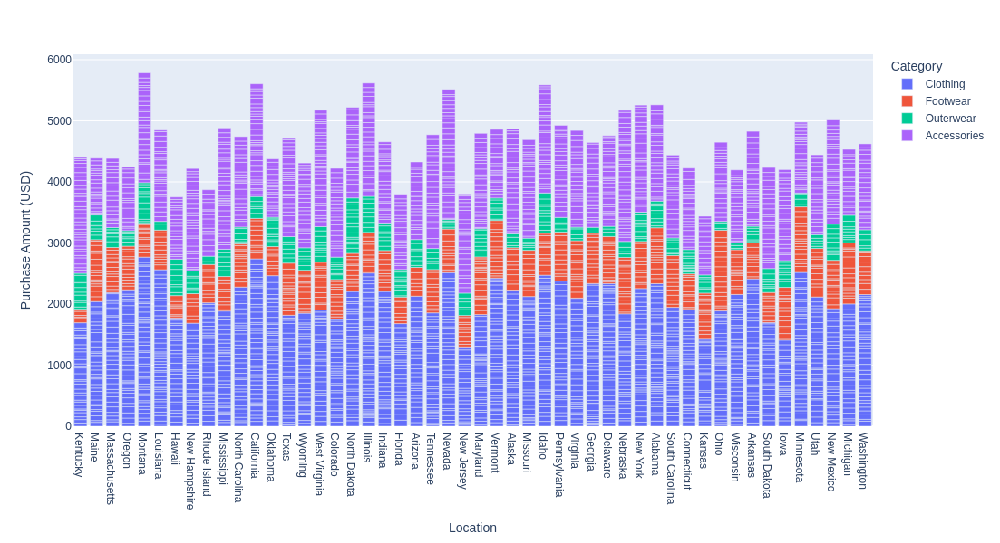

In [32]:
fig = px.bar(shopping_trends_raw_df, x="Location", y="Purchase Amount (USD)", color="Category", width=1100, height=600)
fig.show()

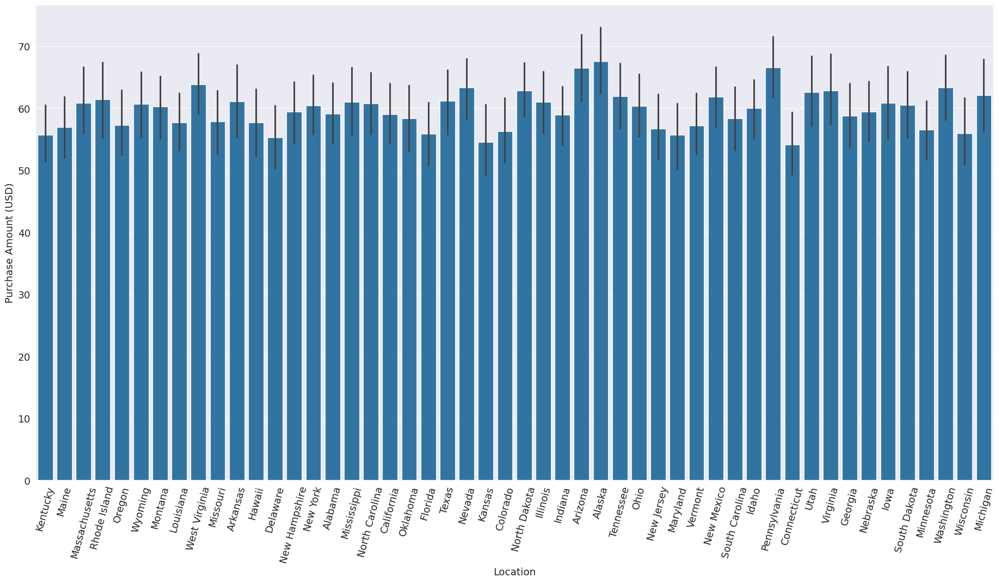

In [33]:
plt.figure(figsize=(24, 12))
# sns.barplot(x = 'Location', y = 'Purchase Amount (USD)', hue="Category", data = shopping_trends_raw_df)
sns.barplot(x = 'Location', y = 'Purchase Amount (USD)', data = shopping_trends_raw_df)
plt.xticks(rotation=75)
plt.show()

### Treemap
- To show proportions of revenue from different categories.

In [34]:
# fig = px.treemap(shopping_trends_raw_df, path=['Category', 'Size', "Color"], values='Purchase Amount (USD)')
# fig = px.treemap(shopping_trends_raw_df, path=['Category'], values='Purchase Amount (USD)')
# fig = px.treemap(shopping_trends_raw_df, path=['Category', 'Size'], values='Purchase Amount (USD)')
fig = px.treemap(shopping_trends_raw_df, path=['Category', 'Season', 'Size', 'Gender', ], values='Purchase Amount (USD)')
fig.show()

## Purchase Amount Analysis

### Histogram
- To visualize the frequency of purchase amounts.

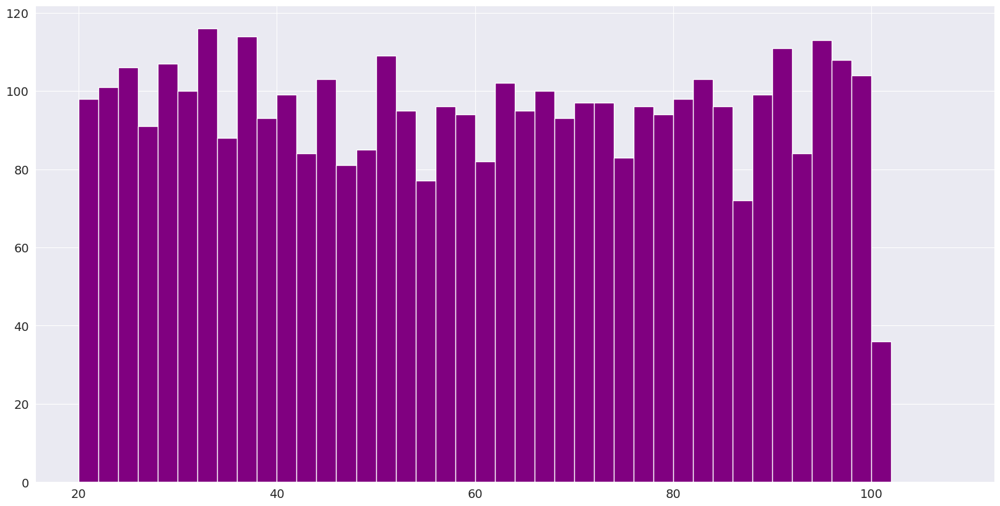

In [35]:
plt.figure(figsize=(20, 10))
plt.hist(shopping_trends_raw_df['Purchase Amount (USD)'], bins=np.arange(20, 110, 2), color='purple');

## Customer Behavior
### Subscription Impact

### Grouped Bar Chart
- To compare subscribers vs. non-subscribers.

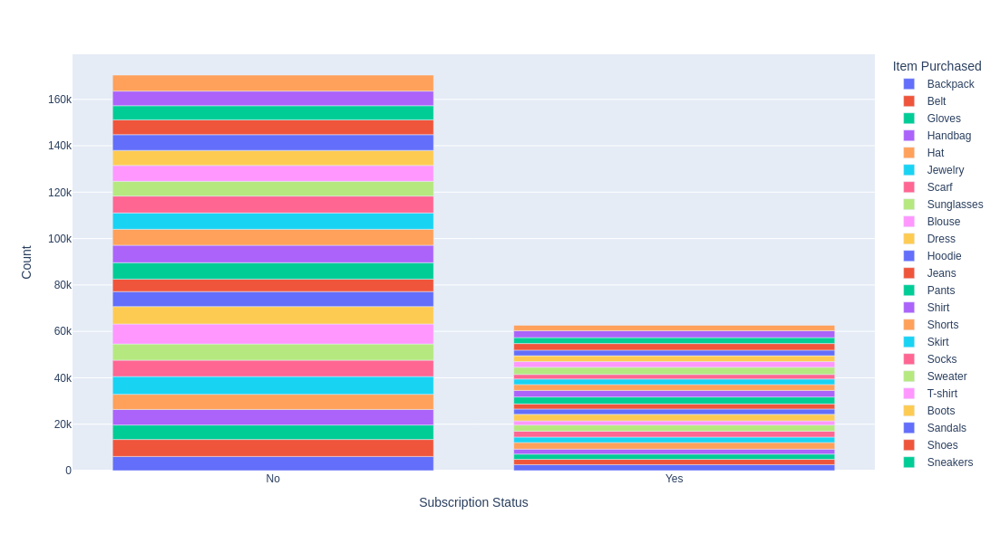

In [54]:
subscription_category_item = shopping_trends_raw_df.groupby(['Subscription Status', 'Category', 'Item Purchased'])['Purchase Amount (USD)'].sum().reset_index()
subscription_category_item.columns = ['Subscription Status', 'Category', 'Item Purchased', 'Count']
subscription_category_item.head(2)
fig = px.bar(subscription_category_item, x="Subscription Status", y="Count", color="Item Purchased", width=1100, height=600)
fig.show()

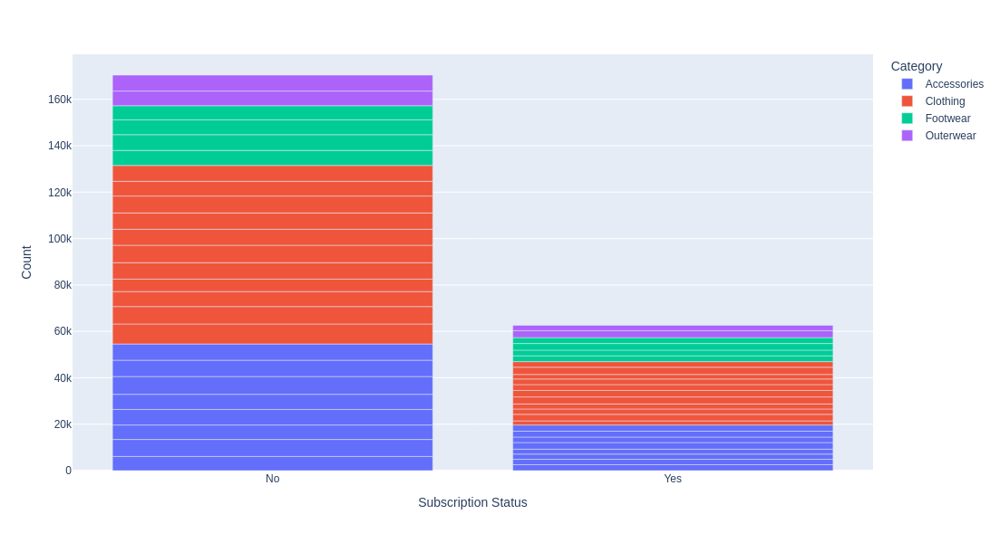

In [55]:
fig = px.bar(subscription_category_item, x="Subscription Status", y="Count", color="Category", width=1100, height=600)
fig.show()

## Previous Purchases & Loyalty

### Bar Chart
- To show preferred categories for repeat customers.

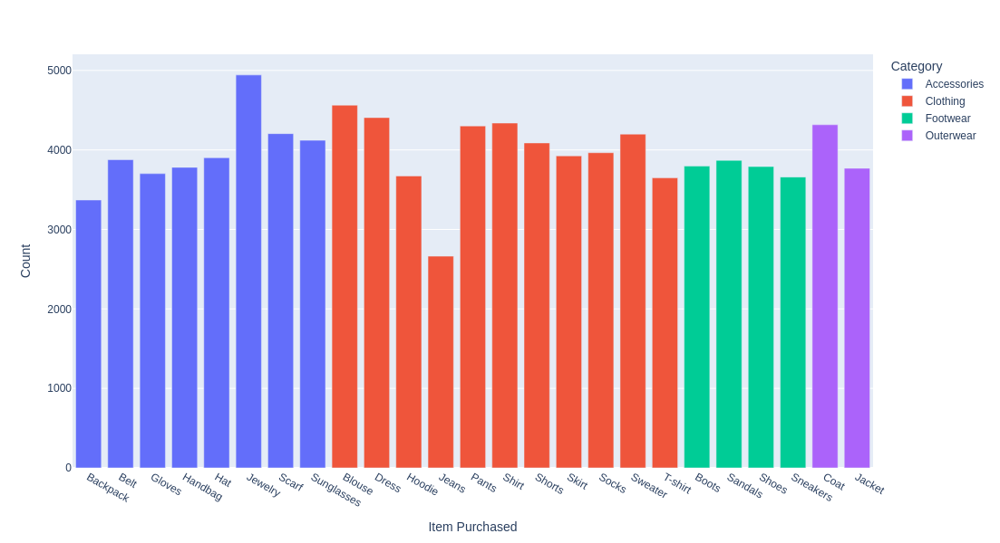

In [59]:
item_previous_purchase_count = shopping_trends_raw_df.groupby(['Category', 'Item Purchased'])['Previous Purchases'].sum().reset_index()
item_previous_purchase_count.columns = ['Category', 'Item Purchased', 'Count']
item_previous_purchase_count.head(2)
fig = px.bar(item_previous_purchase_count, x="Item Purchased", y="Count", color="Category", width=1100, height=600)
fig.show()

## Line Chart
- To analyze loyalty trends over time.

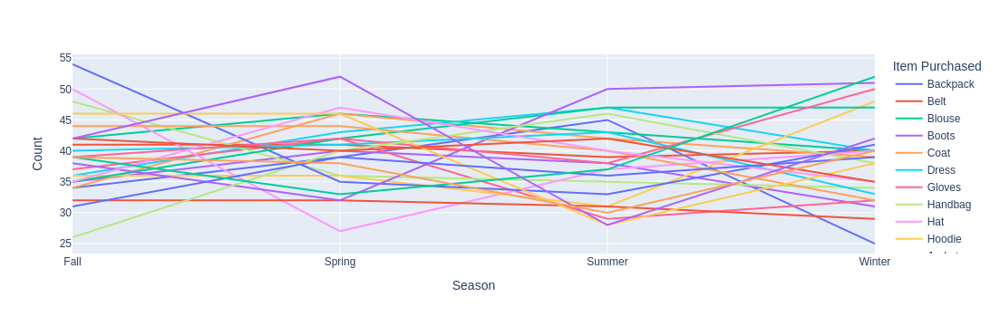

In [62]:
season_items = shopping_trends_raw_df.groupby(['Season', 'Item Purchased'])["Age"].count().reset_index()
season_items.columns = ["Season", "Item Purchased", "Count"]
season_items.head(2)
fig = px.line(season_items, x="Season", y="Count", color="Item Purchased")
fig.show()

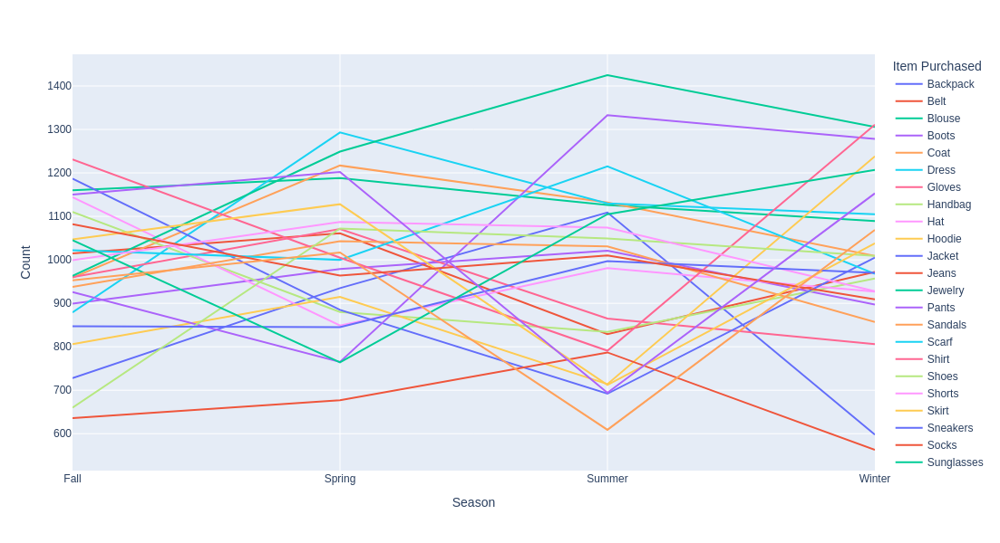

In [66]:
season_frequency = shopping_trends_raw_df.groupby(['Item Purchased', 'Season'])['Previous Purchases'].sum().reset_index()
season_frequency.columns=['Item Purchased', 'Season', 'Count']
season_frequency.head(2)
fig = px.line(season_frequency, x="Season", y="Count", color="Item Purchased", width=1100, height=600)
fig.show()

## Frequency of Purchases

### Bar Chart
- For frequency distribution.

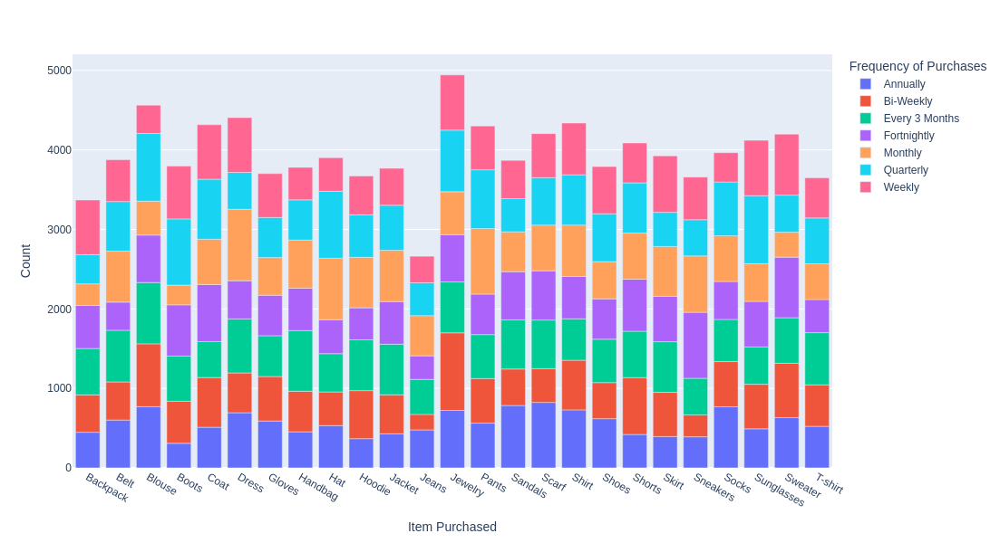

In [68]:
purchases_frequency_item = shopping_trends_raw_df.groupby(['Frequency of Purchases', 'Item Purchased'])['Previous Purchases'].sum().reset_index()
purchases_frequency_item.columns=['Frequency of Purchases', 'Item Purchased', 'Count']
purchases_frequency_item.head(2)
fig = px.bar(purchases_frequency_item, x='Item Purchased', y='Count', color='Frequency of Purchases', width=1100, height=600)
fig.show()

### Scatter Plot
- To analyze frequency vs. purchase amount.

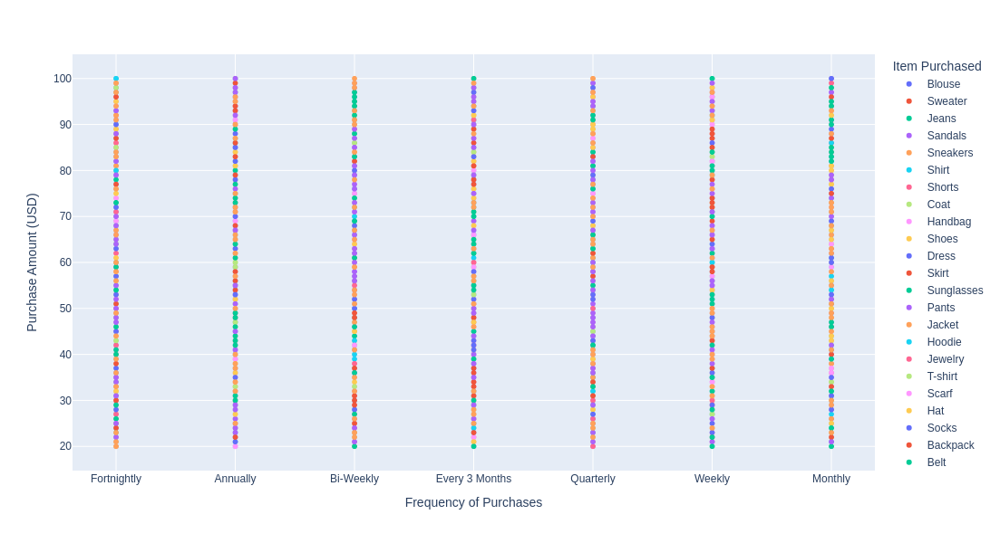

In [70]:
fig = px.scatter(shopping_trends_raw_df, x="Frequency of Purchases", y="Purchase Amount (USD)", color='Item Purchased',  width=1100, height=600)
fig.show()

### Marketing Effectiveness
## Impact of Discounts and Promo Codes

### Bar Chart
- To show the impact of discounts on sales.

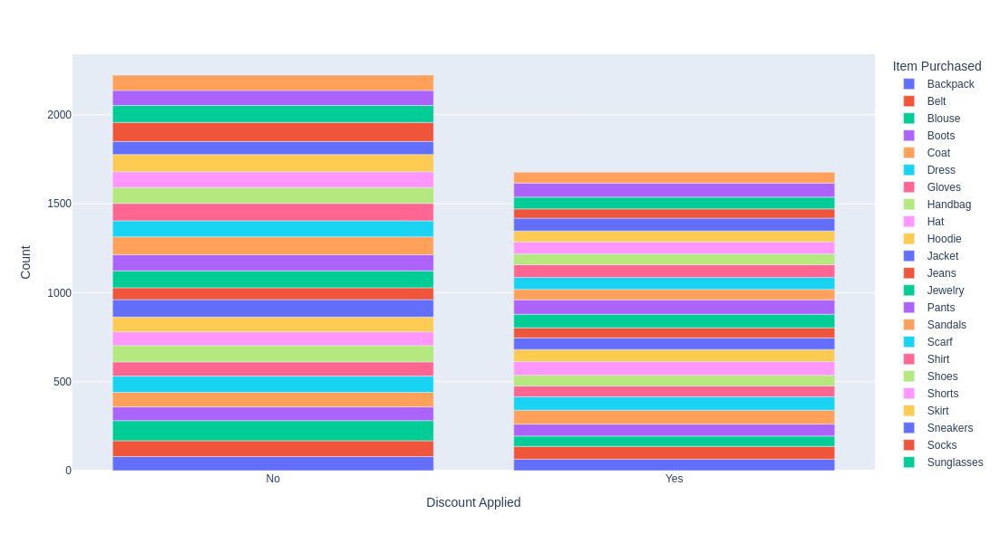

In [71]:
# shopping_trends_raw_df.query('`Discount Applied`=="Yes"').count()
discount_promo_code_items = shopping_trends_raw_df.groupby(['Discount Applied', 'Promo Code Used', 'Item Purchased']).count().reset_index()[['Discount Applied', 'Promo Code Used', 'Item Purchased', 'Customer ID']]
discount_promo_code_items.columns = ['Discount Applied', 'Promo Code Used', 'Item Purchased', 'Count']
discount_promo_code_items.head(2)
fig = px.bar(discount_promo_code_items, x='Discount Applied', y='Count', color='Item Purchased', width=1100, height=600)
fig.show()

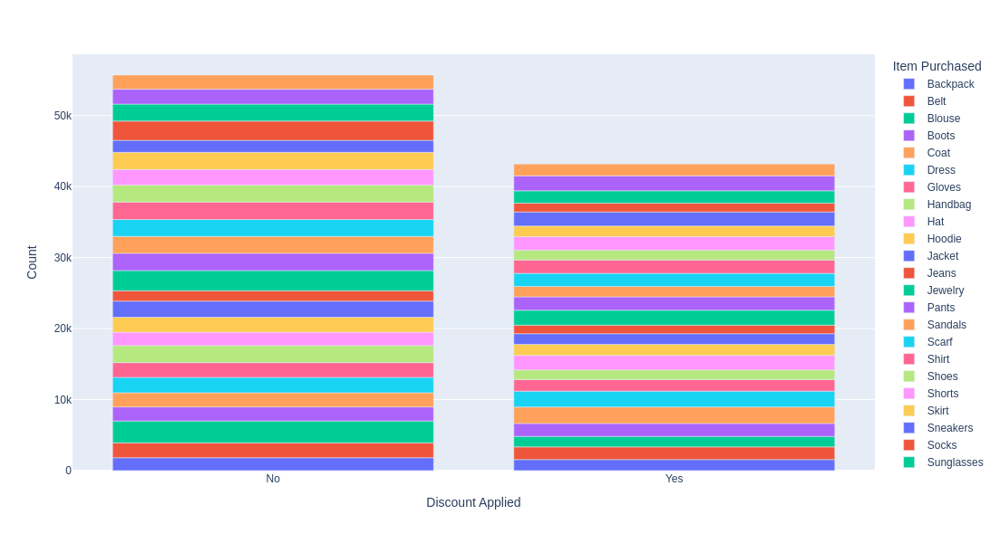

In [72]:
discount_promo_code_purchased_items = shopping_trends_raw_df.groupby(['Discount Applied', 'Promo Code Used', 'Item Purchased'])['Previous Purchases'].sum().reset_index()
discount_promo_code_purchased_items.columns = ['Discount Applied', 'Promo Code Used', 'Item Purchased', 'Count']
discount_promo_code_purchased_items.head(2)
fig = px.bar(discount_promo_code_purchased_items, x='Discount Applied', y='Count', color='Item Purchased', width=1100, height=600)
fig.show()

## Review Ratings

### Boxplot
- To show rating distributions by category.

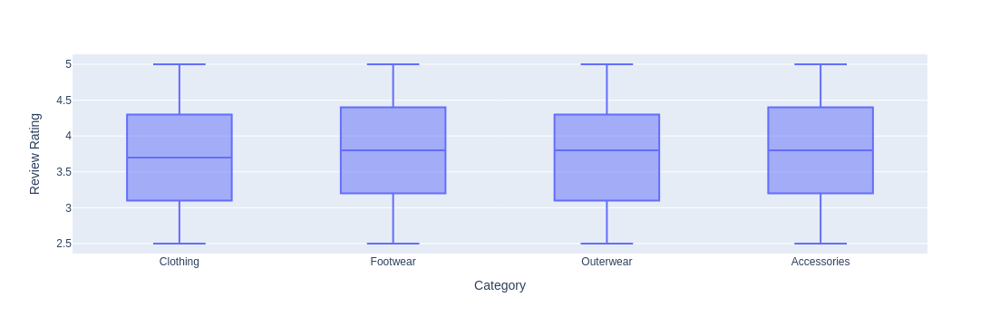

In [73]:
fig = px.box(shopping_trends_raw_df, x="Category", y="Review Rating")
fig.show()

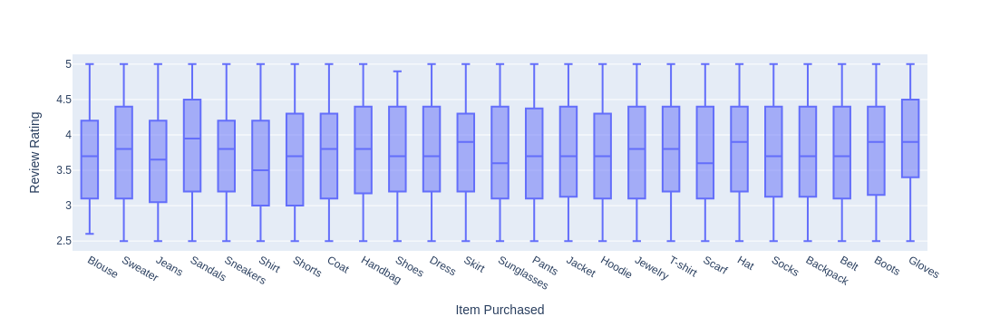

In [74]:
fig = px.box(shopping_trends_raw_df, x="Item Purchased", y="Review Rating")
fig.show()

### Scatter Plot
- To explore the relationship between ratings and sales.

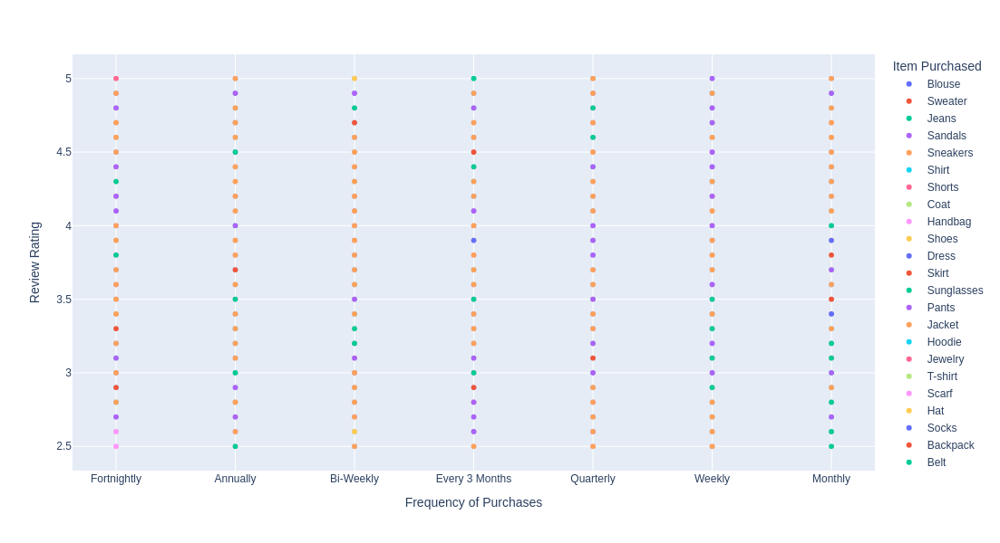

In [75]:
fig = px.scatter(shopping_trends_raw_df, x="Frequency of Purchases", y="Review Rating", color='Item Purchased',  width=1100, height=600)
fig.show()

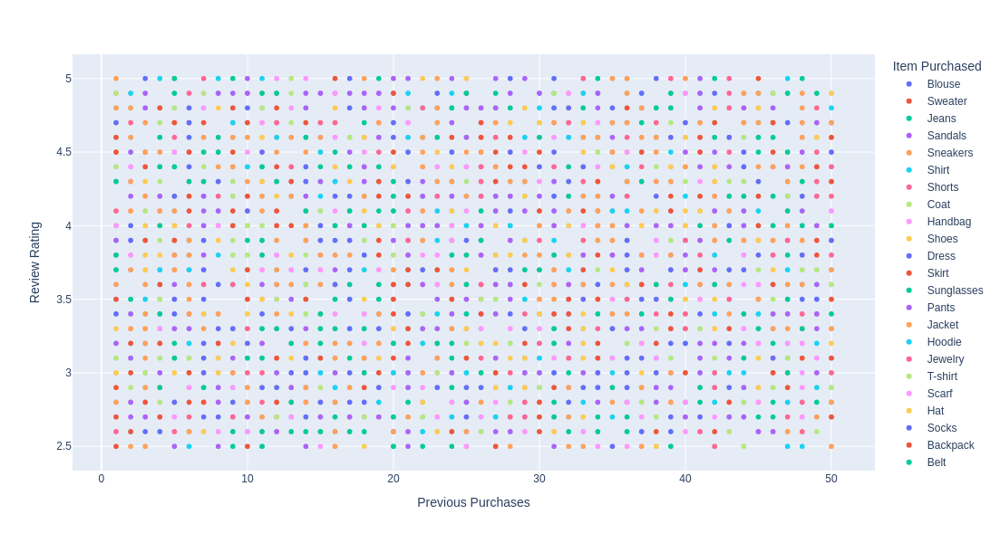

In [76]:
fig = px.scatter(shopping_trends_raw_df, x="Previous Purchases", y="Review Rating", color='Item Purchased',  width=1100, height=600)
fig.show()

## Operational Efficiency
### Shipping Type Analysis

### Stacked Bar Chart
- To compare shipping preferences across demographics.

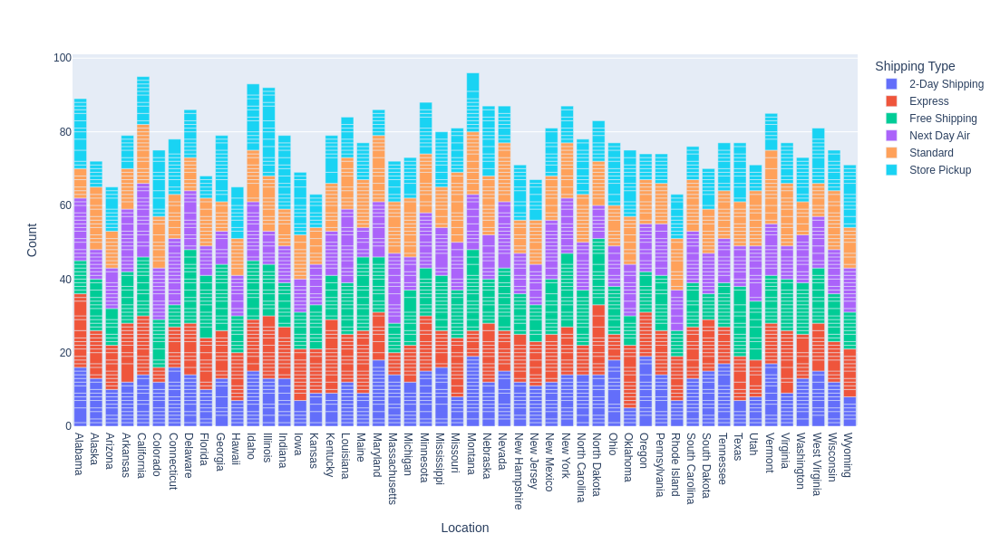

In [79]:
location_shipping = shopping_trends_raw_df.groupby(['Location', 'Shipping Type', 'Category', 'Item Purchased']).count().reset_index()[['Location', 'Shipping Type', 'Category', 'Item Purchased', 'Age']]
location_shipping.columns = ['Location', 'Shipping Type', 'Category', 'Item Purchased', 'Count']
location_shipping.head(2)
fig = px.bar(location_shipping, x="Location", y="Count", color="Shipping Type", width=1100, height=600)
fig.show()

### Pie Chart
- For a proportionate view of shipping type usage.

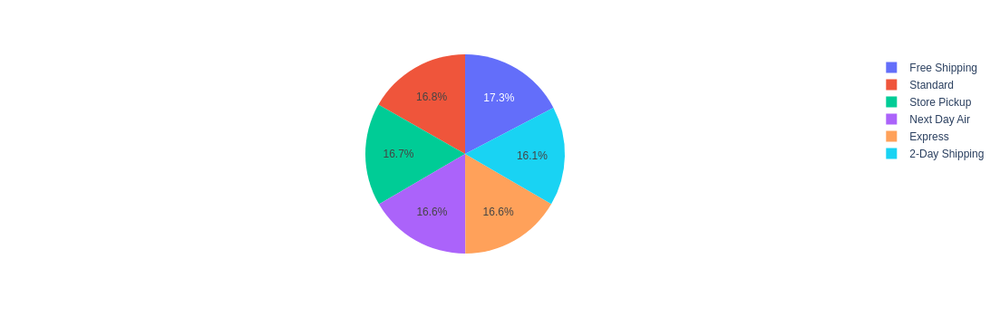

In [80]:
item_shopping_type_previous_count = shopping_trends_raw_df.groupby(['Item Purchased', 'Shipping Type'])['Previous Purchases'].count().reset_index()
item_shopping_type_previous_count.columns = ['Item Purchased', 'Shipping Type', 'Count']
item_shopping_type_previous_count.head(2)
fig = px.pie(item_shopping_type_previous_count, values='Count', names='Shipping Type')
fig.show()

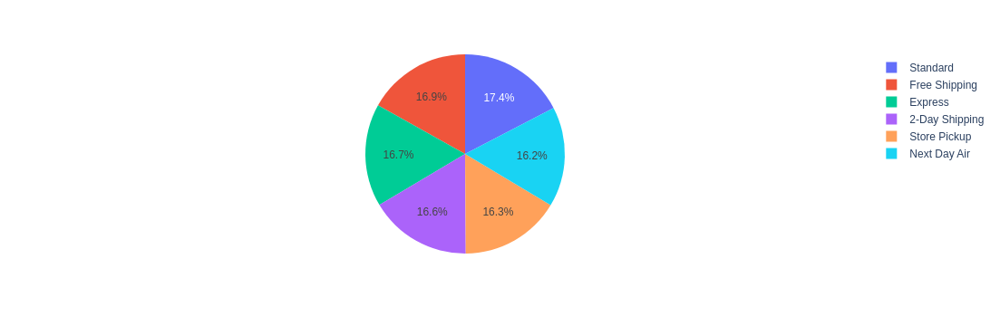

In [81]:
item_shopping_type_previous_sum = shopping_trends_raw_df.groupby(['Item Purchased', 'Shipping Type'])['Previous Purchases'].sum().reset_index()
item_shopping_type_previous_sum.columns = ['Item Purchased', 'Shipping Type', 'Count']
item_shopping_type_previous_sum.head(2)
fig = px.pie(item_shopping_type_previous_sum, values='Count', names='Shipping Type')
fig.show()

## Payment Method Preferences

### Pie Chart
- To show the breakdown of payment method usage.

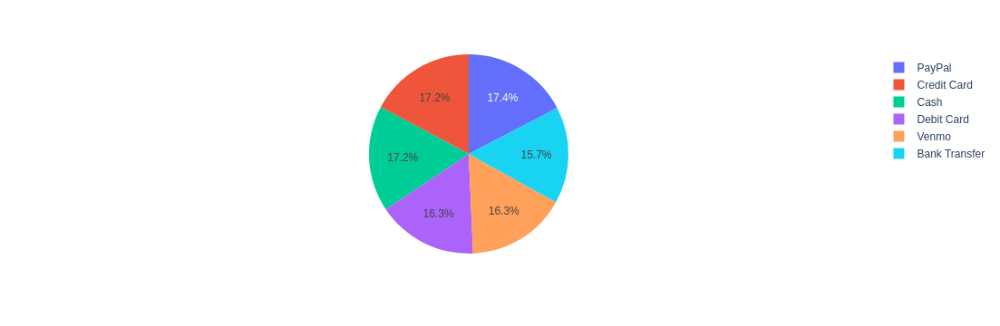

In [82]:
item_payment_method_previous_count = shopping_trends_raw_df.groupby(['Item Purchased', 'Preferred Payment Method'])['Previous Purchases'].count().reset_index()
item_payment_method_previous_count.columns = ['Item Purchased', 'Preferred Payment Method', 'Count']
item_payment_method_previous_count.head(2)
fig = px.pie(item_payment_method_previous_count, values='Count', names='Preferred Payment Method')
fig.show()

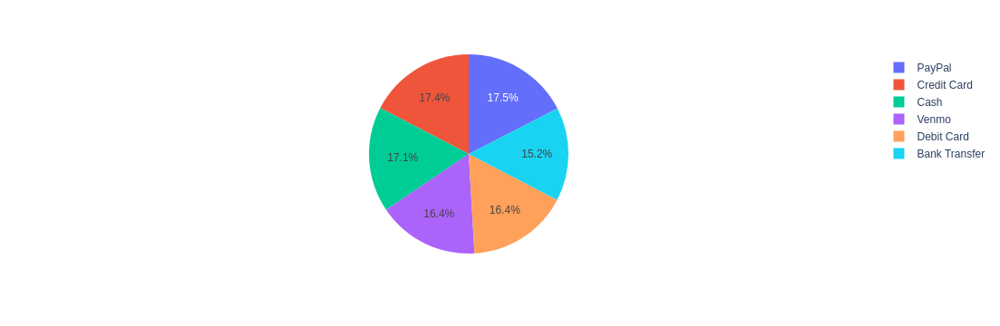

In [83]:
item_payment_method_previous_sum = shopping_trends_raw_df.groupby(['Item Purchased', 'Preferred Payment Method'])['Previous Purchases'].sum().reset_index()
item_payment_method_previous_sum.columns = ['Item Purchased', 'Preferred Payment Method', 'Count']
item_payment_method_previous_sum.head(2)
fig = px.pie(item_payment_method_previous_sum, values='Count', names='Preferred Payment Method')
fig.show()

### Bar Chart
- For a detailed comparison.

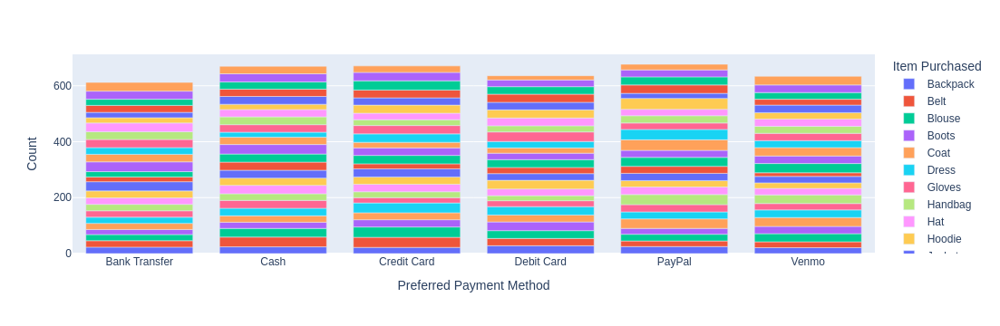

In [87]:
fig = px.bar(item_payment_method_previous_count, x="Preferred Payment Method", y="Count", color="Item Purchased")
fig.show()

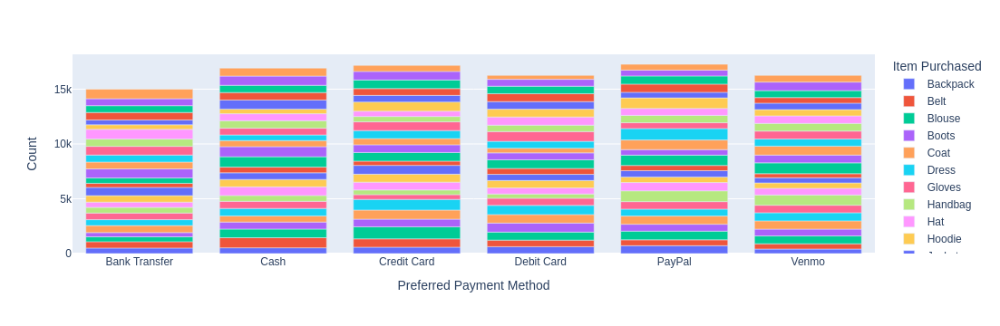

In [86]:
fig = px.bar(item_payment_method_previous_sum, x="Preferred Payment Method", y="Count", color="Item Purchased")
fig.show()

## Cross-Analysis
### Multivariate Analysis

### Scatter Plot Matrix
- To explore relationships between variables.

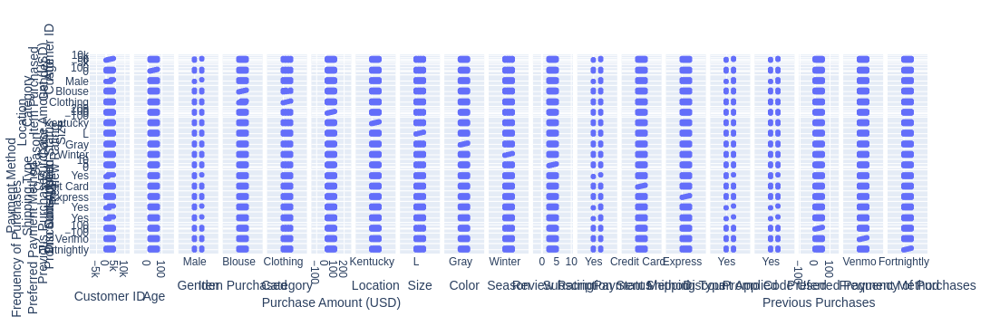

In [88]:
fig = px.scatter_matrix(shopping_trends_raw_df)
fig.show()